In [5]:
# #   leggo il csv
# Con il tuo DataFrame puoi fare:

# Raggruppamenti con groupby() per osservare metriche aggregate per Division, Settimana, ecc.
# Analisi temporali per osservare come le metriche cambiano nel tempo.
# Analisi delle correlazioni per scoprire relazioni tra metriche.
# Calcoli di metriche derivate (come percentuali, rapporti, conversion rate).
# Analisi con condizioni specifiche (filtraggio).
# Visualizzazioni per ottenere una panoramica chiara dei dati
# #   

# Calcolare e mostrare grafici di vendite togliendo i casi superflui, ossia
#   prendere il primo e secondo picco ed analizzarlo senza valori superflui
#   così da trovare effettivamente quanto impattano le singole colonne sulla colonna sales
#   tramite la differenza di proporzione
#   possiamo analizzare le Sales in base ai gruppi


# L'analisi di questo set di dati poteva finire con un solo grafico, quello di correlazione,
# data la mancanza di dati abbastanza importanti, come il costo e la quantità settimanale per gererare ogni engagment, ma per avvalorare e mostrare la mia tesi, ho creato molti altri grafici

# Purtroppo questo set di dati pecca nella spiegazione delle rispettive colonne
# Tipo di piattaforma
# Tipo di contenuto
# Tipo di pubblicità

# Data la mancanza di questi dati, si può completare l'analisi dicendo che ci sono delle correlazioni molto forti tra le vendite e [lista di impressions]
# e tra specifici gruppi [lista dei gruppi e proporzione sulle vendite date dal gruppo]

# Importo le librerie principali

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')
# Impostare Pandas per visualizzare l'output completo
pd.set_option('display.max_columns', None)  # Mostra tutte le colonne
pd.set_option('display.width', 1000)  # Imposta una larghezza complessiva maggiore
pd.set_option('display.max_rows', None)  # Mostra tutte le righe

# Creo un dataframe leggendo il file csv ed analizzo le colonne tramite una funzione che mi smista le colonne numeriche da quelle categoriche

In [2]:
# Leggo il csv creando un dataframe df
df = pd.read_csv('Sample Media Spend Data.csv')

# Creo la funzione get_num_cat_columns(df) che tramite un df in input restituisce le colonne numeriche e categoriche
def get_num_cat_columns(df):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    num = df.select_dtypes(include=numerics).columns.to_list()
    cat = df.select_dtypes(include=['object', 'datetime']).columns.to_list()
    return num, cat

# Eseguo la funzione get_num_cat_columns(df) sul mio dataframe df assegnandolo a due variabile
numeric_columns, categorical_columns  = get_num_cat_columns(df)
#Printo le variabili
print(numeric_columns, categorical_columns)

# Converto la colonna Calendar_Week da stringa a valore datetime
df['Calendar_Week'] = pd.to_datetime(df['Calendar_Week'], errors='coerce')
# Creo una colonna che in basea alla colonna Clendar_Week ne definisce il mese
df['Month'] = df['Calendar_Week'].dt.month_name()

df1 = df.loc[:,df.columns[2:10]]

# Dò un primo sguardo allle prime righe del df
df.head()

['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views', 'Sales'] ['Division', 'Calendar_Week']


,Division,Calendar_Week,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales,Month
0,A,2018-01-06,392,422,408,349895.0107,73580,12072,682,59417,January
1,A,2018-01-13,787,904,110,506270.2176,11804,9499,853,56806,January
2,A,2018-01-20,81,970,742,430042.1538,52232,17048,759,48715,January
3,A,2018-01-27,25,575,65,417745.6658,78640,10207,942,72047,January
4,A,2018-02-03,565,284,295,408505.8012,40561,5834,658,56235,February


In [7]:
# Analizzo le varie informazioni del df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3051 entries, 0 to 3050
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Division               3051 non-null   object        
 1   Calendar_Week          3051 non-null   datetime64[ns]
 2   Paid_Views             3051 non-null   int64         
 3   Organic_Views          3051 non-null   int64         
 4   Google_Impressions     3051 non-null   int64         
 5   Email_Impressions      3051 non-null   float64       
 6   Facebook_Impressions   3051 non-null   int64         
 7   Affiliate_Impressions  3051 non-null   int64         
 8   Overall_Views          3051 non-null   int64         
 9   Sales                  3051 non-null   int64         
 10  Month                  3051 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(7), object(2)
memory usage: 262.3+ KB


In [8]:
# Controllo che per ogni colonna se ci sono e la quantità di valori nan
df.isnull().sum()

Division                 0
Calendar_Week            0
Paid_Views               0
Organic_Views            0
Google_Impressions       0
Email_Impressions        0
Facebook_Impressions     0
Affiliate_Impressions    0
Overall_Views            0
Sales                    0
Month                    0
dtype: int64

In [10]:
# Controllo che non ci siano casi duplicati ritornando il numero totale di righe duplicate
df.duplicated().sum()

# Se ci fossero stai dei duplicati sarebbero stati tolti con
#df = df.drop_duplicates(ignore_index=True)

0

In [ ]:
# Esploro le statistiche descrittive dei dati numerici nel DataFrame df.
df.describe().round(2)

,Calendar_Week,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales
count,3051,3051.00,3051.00,3051.00,3051.00,3051.00,3051.00,3051.00,3051.0
mean,2019-02-02 00:00:00,15093.94,13355.67,886173.83,760509.38,269126.89,22910.90,27980.91,185901.4
min,2018-01-06 00:00:00,1.00,1.00,7.00,40894.45,29.00,910.00,2.00,15436.0
25%,2018-07-21 00:00:00,537.00,712.50,169828.00,378496.92,57073.50,9127.00,747.00,73393.5
50%,2019-02-02 00:00:00,2699.00,4110.00,490531.00,590970.80,127523.00,16658.00,7879.00,113573.0
75%,2019-08-17 00:00:00,17358.00,16230.50,1022621.50,962246.61,283505.00,27486.50,34111.50,202975.5
max,2020-02-29 00:00:00,518190.00,270453.00,17150439.00,7317730.25,7558435.00,175791.00,635057.00,3575430.0
std,NaN,30785.88,24079.40,1355075.82,626014.12,466511.67,21617.64,52054.98,232207.9


In [ ]:
# Osservo e analizzo le varie correlazioni in cerca di qualche correlazione interessante
df[df.columns[1:10]].corr().round(2)

,Calendar_Week,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales
Calendar_Week,1.00,0.40,0.51,0.23,-0.03,0.29,-0.22,0.47,0.16
Paid_Views,0.40,1.00,0.80,0.31,0.29,0.32,0.22,0.96,0.29
Organic_Views,0.51,0.80,1.00,0.43,0.34,0.41,0.23,0.93,0.39
Google_Impressions,0.23,0.31,0.43,1.00,0.64,0.73,0.35,0.38,0.78
Email_Impressions,-0.03,0.29,0.34,0.64,1.00,0.52,0.70,0.33,0.75
Facebook_Impressions,0.29,0.32,0.41,0.73,0.52,1.00,0.29,0.38,0.75
Affiliate_Impressions,-0.22,0.22,0.23,0.35,0.70,0.29,1.00,0.23,0.44
Overall_Views,0.47,0.96,0.93,0.38,0.33,0.38,0.23,1.00,0.35
Sales,0.16,0.29,0.39,0.78,0.75,0.75,0.44,0.35,1.00


# Creo un grafico Heatmap per visualizzare meglio le correlzioni

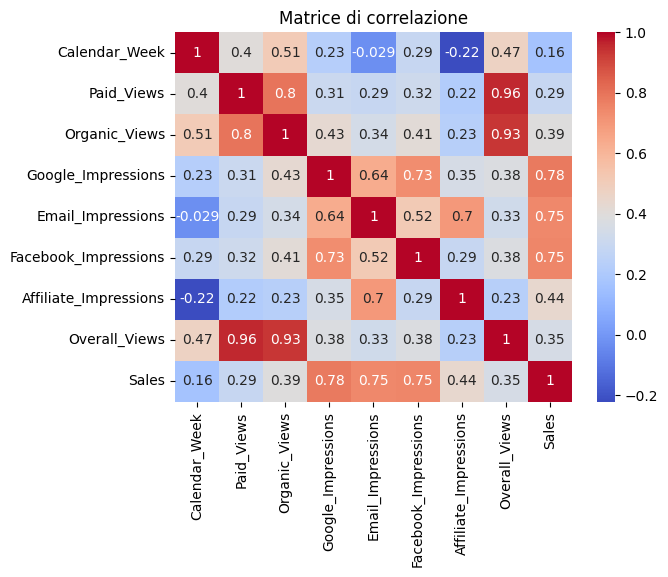

In [4]:
# Creazione della heatmap della matrice di correlazione

# sns.heatmap() crea una heatmap basata sulla matrice di correlazione.
# df[df.columns[1:10]] seleziona le colonne da 1 a 9 (escludendo la prima colonna),
# in modo da calcolare la correlazione solo su un sottoinsieme delle colonne del DataFrame.
# .corr() calcola la matrice di correlazione delle colonne selezionate.
# annot=True aggiunge i valori numerici della correlazione direttamente nelle celle della heatmap.
# cmap="coolwarm" applica la mappa di colori "coolwarm" alla heatmap, che mostra la variazione da blu (bassa correlazione) a rosso (alta correlazione).
sns.heatmap(df[df.columns[1:10]].corr(), annot=True, cmap="coolwarm")

# Imposta il titolo della heatmap
plt.title('Matrice di correlazione')

# Visualizza la heatmap
plt.show()

# Spiegazione del grafico precedente

## Quali sono le colonne correlate fra di loro? E di quanto?

### **Come possiamo vedere dalle varie intensità di colore, alcune colonne hanno una correlazione molto alta fra loro.**

- **Overall_views** è altamente correlato con **Paid_views** (0.96) e **Organic_views** (0.93).
- **Paid_views** e **Organic_views** sono altamente correlati (0.80).
- **Sales** è moderatamente correlato con **Google_impressions** (0.78), **Email_impressions** (0.75) e **Facebook_impressions** (0.75).
- **Google_impressions** e **Facebook_impressions** sono moderatamente correlati (0.73).
- **Affiliate_impressions** e **Email_impressions** sono moderatamente correlati (0.70).
- **Google_impressions** e **Email_impressions** sono moderatamente correlati (0.64).

### **Per questa analisi, la colonna più importante da considerare è **Sales**, che ha correlazioni moderate con:**
- **Google_impressions** (0.78),
- **Email_impressions** (0.75),
- **Facebook_impressions** (0.75).

### **Il resto delle colonne ha correlazioni lievi o nulle, senza correlazioni moderatamente o altamente negative.**

&nbsp;

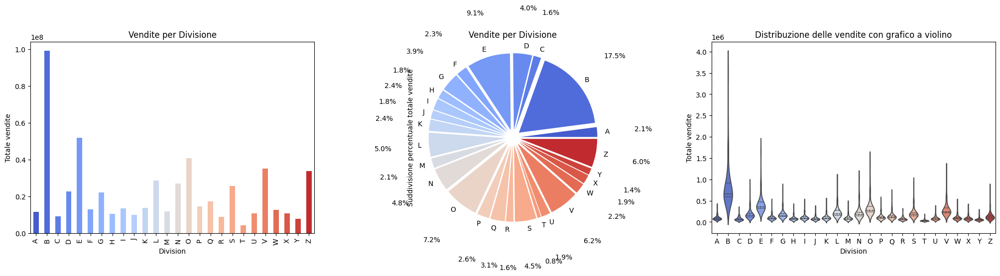

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

# Definizione di una palette comune
# Creiamo una palette di colori utilizzando la gradazione "coolwarm",
# con un numero di colori uguale al numero di divisioni uniche nel dataset.
palette = sns.color_palette("coolwarm", len(df['Division'].unique()))

# Creazione della figura e dei sottotrame
# Creiamo una figura con 1 riga e 3 colonne per i grafici, e impostiamo le dimensioni complessive.
fig, axes = plt.subplots(1, 3, figsize=(25, 5))

# Grafico a barre
# Raggruppiamo i dati per 'Division' e calcoliamo la somma delle vendite per ogni divisione.
# Creiamo un grafico a barre, impostando il colore con la palette definita.
df.groupby('Division')['Sales'].sum().plot(kind='bar', ax=axes[0], color=palette)
axes[0].set_title('Vendite per Divisione')  # Aggiungiamo il titolo al grafico a barre
axes[0].set_ylabel("Totale vendite")  # Aggiungiamo un'etichetta all'asse Y

# Grafico a torta
# Raggruppiamo i dati per 'Division' e calcoliamo la somma delle vendite per ciascuna divisione.
# Creiamo un grafico a torta, impostando le etichette, le percentuali, e i colori.
df_grouped = df.groupby('Division')['Sales'].sum()
axes[1].pie(df_grouped, labels=df_grouped.index, autopct='%1.1f%%', pctdistance=1.6, 
            colors=palette, explode= [0.1] * len(df_grouped))
axes[1].set_title("Vendite per Divisione")  # Aggiungiamo il titolo al grafico a torta
axes[1].set_ylabel("Suddivisione percentuale totale vendite")  # Aggiungiamo un'etichetta descrittiva

# Grafico a violino
# Creiamo un grafico a violino per visualizzare la distribuzione delle vendite per ciascuna divisione.
# Mostriamo i quartili all'interno di ogni violino, e usiamo la stessa palette di colori.
sns.violinplot(x='Division', y='Sales', data=df, inner='quartile', palette=palette, ax=axes[2])
axes[2].set_title('Distribuzione delle vendite con grafico a violino')  # Aggiungiamo il titolo al grafico a violino
axes[2].set_ylabel("Totale vendite")  # Aggiungiamo un'etichetta all'asse Y

# Visualizzazione finale
# Mostriamo i grafici all'utente
plt.show()


# Spiegazione grafico precedente

## Come sono suddivise nel nostre vendite? Quanto si differenziano fra loro? In che percentuale? E come sono distribuite?

### **Grafico a barre (Barplot)**:
- Il grafico a barre mostra il totale delle vendite per ciascuna divisione. Ogni barra rappresenta una divisione, e l'altezza della barra è proporzionale al totale delle vendite. 
Il colore di ogni barra è determinato dalla palette "coolwarm", che cambia in base alla divisione.

### **Grafico a torta (Pie)**:
- Il grafico a torta rappresenta la percentuale di vendite per ciascuna divisione. Ogni fetta della torta indica il contributo percentuale di una divisione al totale complessivo delle vendite. 
Le etichette mostrano le percentuali, e ogni divisione è colorata utilizzando la stessa palette del grafico a barre. Le fette sono anche "esplose" leggermente per evidenziare ogni segmento.

### **Grafico a violino (Violinplot)**:
- Il grafico a violino mostra la distribuzione delle vendite all'interno di ciascuna divisione, rappresentando la densità dei dati. 
Le forme a violino indicano come sono distribuite le vendite per ogni divisione, con quartili e mediane visualizzati all'interno del grafico. 
Il colore del violino è legato alla palette e aiuta a distinguere le divisioni.
Questi tre grafici forniscono una visione completa delle vendite per divisione: il totale, la distribuzione percentuale e la variabilità.

&nbsp;

In [10]:
# Importazioni delle librerie necessarie
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

# Calcolare il totale delle vendite per Divisione e Mese
# 'Total_Sales_Month' è una nuova colonna che somma le vendite per ogni combinazione di Divisione e Mese
df['Total_Sales_Month'] = df.groupby(['Division', 'Month'])['Sales'].transform('sum')

# Definizione delle colonne relative alle impressioni
# Le colonne indicano diversi tipi di impressioni (visualizzazioni a pagamento, organiche, ecc.)
impression_columns = df.columns[2:9]

# Riorganizzazione dei dati in formato long per includere i tipi di impressioni
# 'df.melt()' trasforma il DataFrame da formato largo a formato lungo,
# in cui le colonne degli impressioni diventano una sola colonna con il tipo di impressione.
df_impressions = df.melt(id_vars=["Division", "Month", "Total_Sales_Month"], 
                         value_vars=impression_columns, 
                         var_name="Impressions_Type", 
                         value_name="Impressions")

# Calcolare la somma totale delle impression per ogni Divisione e Mese
# Aggiungiamo una nuova colonna 'Total_Impressions_Month' che somma tutte le impressioni per ogni combinazione di Divisione e Mese
df_impressions['Total_Impressions_Month'] = df_impressions.groupby(['Division', 'Month'])['Impressions'].transform('sum')

# Calcolare la proporzione delle vendite per tipo di impressione
# Per ogni tipo di impressione, calcoliamo quanto ciascuna influisce sulle vendite totali di quel mese e divisione
df_impressions['Sales_Per_Impression'] = (df_impressions['Impressions'] / df_impressions['Total_Impressions_Month']) * df_impressions['Total_Sales_Month']

# Creazione del grafico Sunburst per le vendite (figura 1)
# Il grafico Sunburst mostra la distribuzione delle vendite per Divisione, Mese e Tipo di Impressione
fig1 = px.sunburst(df_impressions, 
                  path=["Division", "Month", "Impressions_Type"], 
                  values="Sales_Per_Impression",  # Utilizziamo la colonna 'Sales_Per_Impression' per determinare le dimensioni del grafico
                  color="Sales_Per_Impression",  # I colori sono determinati dalle vendite per impressione
                  color_continuous_scale="Viridis")  # La mappa dei colori è "Viridis", che è una gradazione di colori

# Personalizzare il tracciato Sunburst
# Modifica del testo nel grafico e dei dettagli dell'hover per visualizzare solo le vendite
fig1.update_traces(textinfo="label+percent entry+value", 
                  hovertemplate="Vendite: %{value}")  # Durante il passaggio del mouse, mostriamo il valore delle vendite

# Impostazione del titolo del grafico
fig1.update_layout(title_text="Vendite per Divisione, Mese e Tipo di Impressione")

# Riorganizzazione dei dati in formato long per le impressioni (figura 2)
# Utilizziamo lo stesso approccio di prima, ma questa volta solo per le impressioni
df_long = df.melt(id_vars=["Division", "Month"], 
                  value_vars=impression_columns, 
                  var_name="Impressions_Type", 
                  value_name="Impressions")

# Creazione del grafico Sunburst per le impressioni (figura 2)
# Il grafico Sunburst mostra la distribuzione delle impressioni per Divisione e Mese
fig2 = px.sunburst(df_long, path=["Division", "Month", "Impressions_Type"], values="Impressions")

# Personalizzare il tracciato Sunburst per le impressioni
# Modifica del testo nel grafico e dei dettagli dell'hover per visualizzare solo il numero delle impressioni
fig2.update_traces(textinfo="label+percent entry+value", 
                   hovertemplate="<b>Impressioni: %{value}")  # Durante il passaggio del mouse, mostriamo il numero delle impressioni

# Impostazione del titolo del grafico
fig2.update_layout(title_text="Impressioni per Divisione e Mese")

# Creare un layout con due colonne per visualizzare entrambi i grafici
# 'make_subplots()' ci permette di combinare più grafici in una singola figura con layout a più sottotrame
fig = make_subplots(
    rows=1, cols=2,  # Una sola riga con due colonne
    subplot_titles=["Vendite per Divisione e Mese", "Impressioni per Divisione e Mese"],  # Titoli per ogni sottotrama
    column_widths=[0.5, 0.5],  # Assegnare una larghezza uguale a ciascuna colonna
    specs=[[{'type': 'sunburst'}, {'type': 'sunburst'}]]  # Specificare che entrambi i grafici sono di tipo 'sunburst'
)

# Aggiungere i tracciati dai due grafici (figura 1 e figura 2) alle rispettive sottotrame
# Aggiungiamo i tracciati del grafico delle vendite alla prima sottotrama
for trace in fig1.data:
    fig.add_trace(trace, row=1, col=1)
# Aggiungiamo i tracciati del grafico delle impressioni alla seconda sottotrama
for trace in fig2.data:
    fig.add_trace(trace, row=1, col=2)

# Aggiornare il layout della figura complessiva per un aspetto più pulito
fig.update_layout(
    height=800,  # Impostiamo l'altezza totale della figura
    title_text="Sunburst Diagram per Vendite e Impressioni",  # Titolo della figura
    showlegend=False  # Disabilitiamo la legenda (non necessaria per i grafici Sunburst)
)

# Mostrare il grafico combinato
fig.show()


# Spiegazione grafico precedente

### 1. **Grafico Sunburst delle Vendite per Divisione e Mese**:
   - Questo grafico **Sunburst** visualizza la distribuzione delle **vendite** per **Divisione**, **Mese** e **Tipo di Impressions**.
   - Ogni segmento rappresenta una combinazione di queste variabili e la dimensione del segmento è proporzionale alle **vendite per impressions**. I colori all'interno dei segmenti indicano l'entità delle vendite: colori più scuri o brillanti riflettono vendite più alte.
   - Il grafico consente di esplorare facilmente come le vendite si distribuiscono tra le diverse divisioni e mesi, nonché l'impatto dei vari tipi di visualizzazioni sulle vendite.

### 2. **Grafico Sunburst delle Visualizzazioni per Divisione e Mese**:
   - Questo grafico **Sunburst** visualizza la distribuzione delle **visualizzazioni** per **Divisione** e **Mese**, suddividendo le visualizzazioni per **Tipo di Impressions**.
   - Ogni segmento mostra la quantità di visualizzazioni per un determinato tipo (ad esempio, visualizzazioni a pagamento, organiche, ecc.), ed è proporzionale alla quantità totale di visualizzazioni per quel mese e divisione.
   - Questo grafico aiuta a comprendere la distribuzione delle visualizzazioni e a confrontare i diversi tipi di visualizzazioni per ogni divisione e mese.

### **Barra di Correlazione**:
   - Tra i due grafici, è presente una **barra di correlazione** che rappresenta la relazione tra i due set di dati (vendite e visualizzazioni). Sebbene non indichi una correlazione diretta tra le variabili, la barra aiuta a capire visualmente l'intensità delle vendite e delle visualizzazioni attraverso un gradiente di colori.
   - I valori di correlazione vanno da "Bassa" a "Alta", con i colori che variano dalla parte sinistra (bassa correlazione) alla parte destra (alta correlazione).

### **Complessivamente**:
Questi grafici insieme permettono di esplorare le vendite e le visualizzazioni in modo interattivo e visivo, analizzando come le diverse divisioni, mesi e tipi di visualizzazioni influiscono su ciascun aspetto. La barra di correlazione funge da riferimento visivo per il legame tra le vendite e le visualizzazioni.

&nbsp;

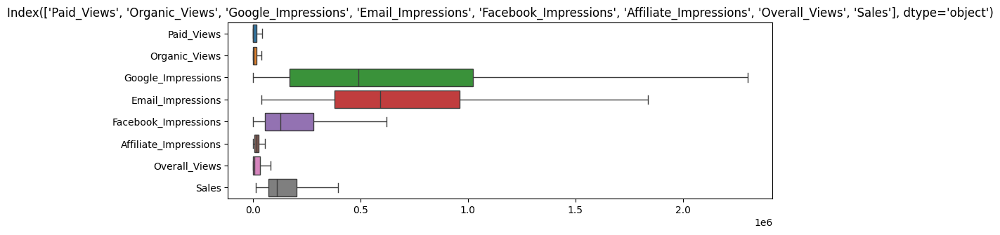

In [6]:
column_batches = [df.columns[2:10]]
#column_batches = [['Paid_Views', 'Organic_Views', 'Affiliate_Impressions','Overall_Views'],['Google_Impressions', 'Email_Impressions', 'Facebook_Impressions'],['Sales']]
plt.figure(figsize=(10,15))
for n,i in enumerate(column_batches):
    plt.subplot(4,1,n+1)
    sns.boxplot(df[i], orient="h")
    plt.title(i)

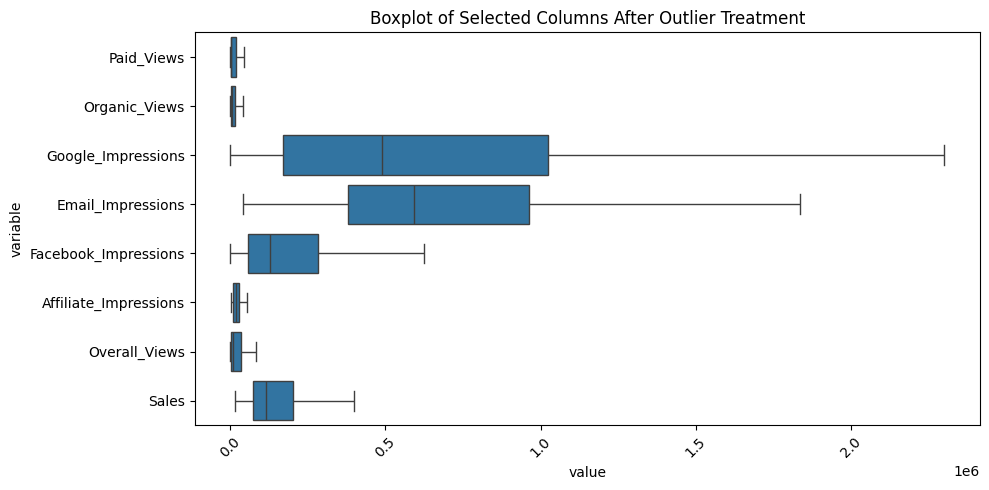

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def treat_outliers(df_in, col):
    # Copia il DataFrame per non sovrascrivere i dati originali
    df_out = df_in.copy()
    # Calcola il primo e terzo quartile
    q1 = df_out[col].quantile(0.25)
    q3 = df_out[col].quantile(0.75)
    # Calcola l'IQR
    iqr = q3 - q1
    # Calcola i limiti inferiori e superiori
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Tratta gli outliers: sostituisci i valori estremi
    df_out.loc[df_out[col] < lower_bound, col] = lower_bound
    df_out.loc[df_out[col] > upper_bound, col] = upper_bound

    return df_out

# Controllo se tutte le colonne sono numeriche
fields_to_outlier_treatment = df.columns[2:10]
df_numeric_columns = df[fields_to_outlier_treatment].select_dtypes(include=['number']).columns

# Applica il trattamento degli outliers a tutte le colonne numeriche selezionate
for col in df_numeric_columns:
    df = treat_outliers(df, col)

# Raccogliamo tutti i dati da plottare in un unico DataFrame "long" per il boxplot
df_long = pd.melt(df, value_vars=df_numeric_columns)

# Creazione di un singolo boxplot per tutte le colonne
plt.figure(figsize=(10, 5))  # Impostiamo una dimensione adeguata per il grafico

sns.boxplot(y='variable', x='value', data=df_long)  # Variabile sull'asse x e valori sull'asse y

# Impostiamo il titolo del grafico
plt.title("Boxplot of Selected Columns After Outlier Treatment")
plt.xticks(rotation=45)  # Ruotiamo le etichette delle colonne per migliorarne la leggibilità

# Mostra il grafico
plt.tight_layout()
plt.show()


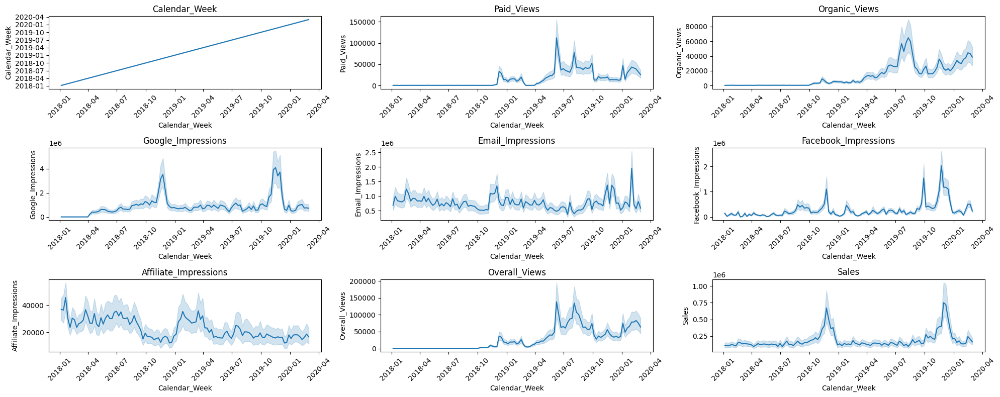

In [11]:
import numpy as np  # Importiamo la libreria numpy per la gestione delle indici

# Creazione della griglia di grafici
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Creiamo una griglia di 3 righe e 3 colonne per i grafici, con una dimensione totale di 20x8 pollici

# Lista delle metriche da visualizzare
colonne = df.columns[1:]  # Selezioniamo tutte le colonne del dataframe tranne la prima (probabilmente 'Calendar_Week')

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):  # Iteriamo attraverso tutte le posizioni della griglia (3x3)
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):  # Se l'indice è inferiore alla lunghezza delle colonne (metriche)
        sns.lineplot(data=df, x='Calendar_Week', y=colonne[idx], ax=axes[row, col])  # Creiamo un grafico a linea per ogni metrica
        axes[row, col].set_title(f'{colonne[idx]}')  # Aggiungiamo il titolo del grafico usando il nome della metrica
        axes[row, col].tick_params(axis='x', rotation=45)  # Ruotiamo le etichette dell'asse x per renderle leggibili
    else:
        # Se ci sono spazi vuoti nella griglia (esempio: se ci sono meno di 9 metriche), nascondiamo l'asse
        axes[row, col].axis('off')  # Nascondiamo l'asse vuoto

# Ottimizzare la visualizzazione
plt.tight_layout()  # Ottimizza lo spazio tra i grafici per evitare sovrapposizioni
plt.show()  # Mostra i grafici generati


# Ecco la descrizione dei vari grafici che vengono generati nel codice precedente

## Come sono distribuite le visualizzazioni e le vendite? Hanno dei trend? Sono simili? Quali si rispecchiano di più? Dove e quando?

### **Grafico a Linea n°1**:
   - **Tipo di grafico**: Linea.
   - **Descrizione**: Questo grafico mostra l'andamento settimanale delle **vendite** (o altra metrica). L'asse **X** rappresenta le **settimane del calendario** (Calendar_Week), mentre l'asse **Y** mostra il valore delle **vendite** per quella settimana.
   - **Interpretazione**: Sta semplicemente tracciando una progressione dove la variabile Y cresce in modo proporzionale alla variabile X, rappresentando una crescita lineare. Utile per dare un orientamento nel grafico.

### **Grafici a Linea da n°2 a n°8**:
   - **Tipo di grafico**: Linea.
   - **Descrizione**: Ognuno di questi grafici mostra l'andamento settimanale di ciascun **tipo di visualizzazioni**. L'asse **X** è rappresentato dalle **settimane del calendario**, mentre l'asse **Y** mostra il numero di **visualizzazioni ricevute** per ogni settimana.
   - **Interpretazione**: Visualizza come le visualizzazioni sono cambiate nel tempo. Può aiutare a comprendere l'efficacia e la correlazione tra i tipi visualizzazioni e vendite se confrontati con il grafico n°9.

### **Grafico a Linea n°9**:
   - **Tipo di grafico**: Linea.
   - **Descrizione**: Questo grafico mostra l'andamento settimanale delle **vendite** (o altra metrica). L'asse **X** rappresenta le **settimane del calendario** (Calendar_Week), mentre l'asse **Y** mostra il valore delle **vendite** per quella settimana.
   - **Interpretazione**: Aiuta a visualizzare come le vendite sono cambiate nel tempo, evidenziando tendenze, picchi o cali nelle vendite settimanali.

### **Note Generali**:
- **Titoli dei Grafici**: Ogni grafico è etichettato con il nome della metrica (ad esempio, "Sales", "Paid_Views", "Organic_Views", ecc.), per identificare facilmente la metrica mostrata.
- **Asse X (settimane)**: Tutti i grafici usano lo stesso asse **X**, che rappresenta le **settimane del calendario** (Calendar_Week), facilitando il confronto tra le metriche per lo stesso intervallo di tempo.
- **Ruotamento delle Etichette X**: Le etichette sull'asse X sono ruotate di **45 gradi** per migliorare la leggibilità delle settimane.

### **Osservazioni**:
Come possiamo vedere, i grafici rispecchiano perfettamente le correlazioni visualizzate nel grafico di correlazione (Heatmap) creato precedentemente.
L'andamento delle visualizzazioni lungo le settimane nei grafici n°6, n°7 e n°8, rispettivamente di Google, Email e Facebook, rispecchia quasi totalmente il grafico n°9 delle vendite, mentre gli altri grafici lo rispecchiano solo parzialmente, questo insieme di grafici avvalora la nostra tesi, ovvero che alcune visualizzazioni sono state cruciali per il totale delle vendite, mentre alcune solo parzialmente.

### **Conclusioni**:
Questi grafici a linee forniscono una panoramica dell'andamento delle principali metriche di performance nel tempo. Possono essere utilizzati per analizzare tendenze, stagionalità e impatti di varie attività di marketing, come campagne pubblicitarie, traffico organico e impressioni.

&nbsp;

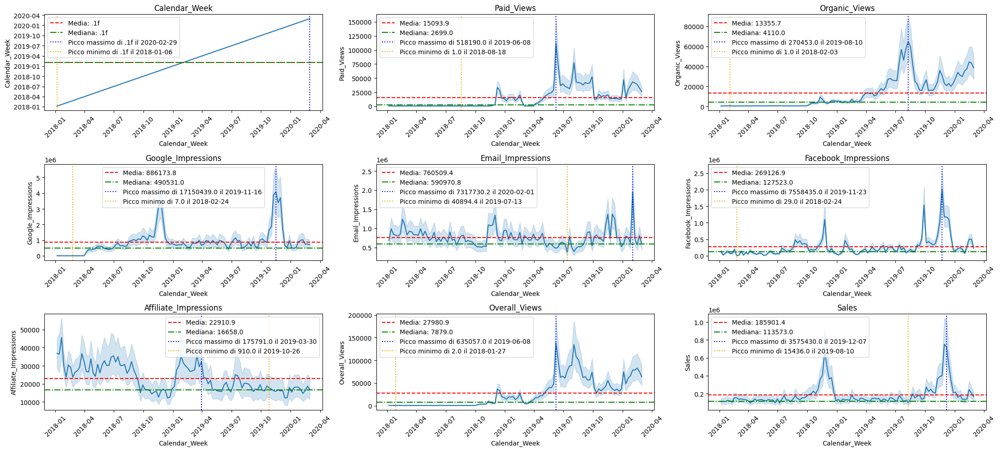

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica della griglia di grafici
fig, axes = plt.subplots(3, 3, figsize=(22, 10))  # Crea una griglia 3x3 di grafici (3 righe e 3 colonne)
# figsize=(22, 10) specifica le dimensioni del grafico (22 pollici di larghezza e 10 di altezza)

# Lista delle metriche da visualizzare
colonne = df.columns[1:10]  # Selezioniamo le colonne da visualizzare, escludendo la prima (presumibilmente 'Calendar_Week')

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # np.ndindex(axes.shape) genera gli indici di tutte le posizioni nella griglia 3x3
    # idx rappresenta l'indice corrente, row e col sono le coordinate della cella corrente nella griglia

    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        try:
            # Calcolare il minimo e massimo per il singolo grafico
            y_min = df[colonne[idx]].min()  # Troviamo il valore minimo della metrica corrente
            y_max = df[colonne[idx]].max()  # Troviamo il valore massimo della metrica corrente

            # Troviamo la settimana ('Calendar_Week') corrispondente al picco massimo e minimo
            p_x_max = df.loc[df[colonne[idx]].idxmax(), 'Calendar_Week']  # Settimana in cui si trova il picco massimo
            p_x_min = df.loc[df[colonne[idx]].idxmin(), 'Calendar_Week']  # Settimana in cui si trova il picco minimo
            
            # Disegnare il grafico con la sua scala
            sns.lineplot(data=df, x='Calendar_Week', y=colonne[idx], ax=axes[row, col])  # Grafico a linee
            axes[row, col].set_title(f'{colonne[idx]}')  # Impostiamo il titolo del grafico
            axes[row, col].tick_params(axis='x', rotation=45)  # Ruotiamo le etichette dell'asse x di 45 gradi per leggibilità

            # Aggiungere la media della y
            mean_yvalue = df[colonne[idx]].mean()  # Calcoliamo la media della metrica corrente
            axes[row, col].axhline(mean_yvalue, color='red', linestyle='--', label=f'Media: {mean_yvalue:.1f}')  
            # Disegniamo una linea orizzontale rossa tratteggiata per rappresentare la media, con una label

            # Aggiungere la mediana della y
            median_yvalue = df[colonne[idx]].median()  # Calcoliamo la mediana della metrica corrente
            axes[row, col].axhline(median_yvalue, color='green', linestyle='-.', label=f'Mediana: {median_yvalue:.1f}')
            # Disegniamo una linea orizzontale verde tratteggiata per rappresentare la mediana, con una label

            # Disegnare la linea del massimo picco (commentata)
            # axes[row, col].axhline(y=y_max, color='blue', linestyle=':', label=f'Max: {y_max:.2f}')
            # Questo codice è commentato, ma avrebbe disegnato una linea orizzontale blu per il picco massimo

            # Disegnare la linea del minimo picco (commentata)
            # axes[row, col].axhline(y=y_min, color='orange', linestyle=':', label=f'Min: {y_min:.2f}')
            # Questo codice è commentato, ma avrebbe disegnato una linea orizzontale arancione per il picco minimo

            # Aggiungere una linea verticale per il picco massimo
            axes[row, col].axvline(x=p_x_max, color='blue', linestyle=':', label=f'Picco massimo di {y_max:.1f} il {str(p_x_max)[:10]}')
            # La linea verticale blu segnala il picco massimo con la data associata

            # Aggiungere una linea verticale per il picco minimo
            axes[row, col].axvline(x=p_x_min, color='orange', linestyle=':', label=f'Picco minimo di {y_min:.1f} il {str(p_x_min)[:10]}')
            # La linea verticale arancione segnala il picco minimo con la data associata

            # Aggiungere una legenda al grafico per visualizzare le informazioni aggiuntive
            axes[row, col].legend(fontsize=10)  # Impostiamo la dimensione del carattere della legenda

        except Exception as e:
            # Se c'è un errore durante il calcolo o la visualizzazione di un grafico, disabilitiamo l'asse e stampiamo l'errore
            axes[row, col].axis('off')  # Nascondiamo l'asse in caso di errore
            print(f"Errore con la metrica '{colonne[idx]}': {e}")  # Stampiamo l'errore nel terminale

    else:
        # Se ci sono spazi vuoti nella griglia (per esempio, più assi che metriche), nascondiamo gli assi vuoti
        axes[row, col].axis('off')  # Nascondiamo l'asse vuoto

# Ottimizzare la visualizzazione e la disposizione degli assi
plt.tight_layout()  # Ottimizza la disposizione degli assi per evitare sovrapposizioni
plt.show()  # Mostra il grafico


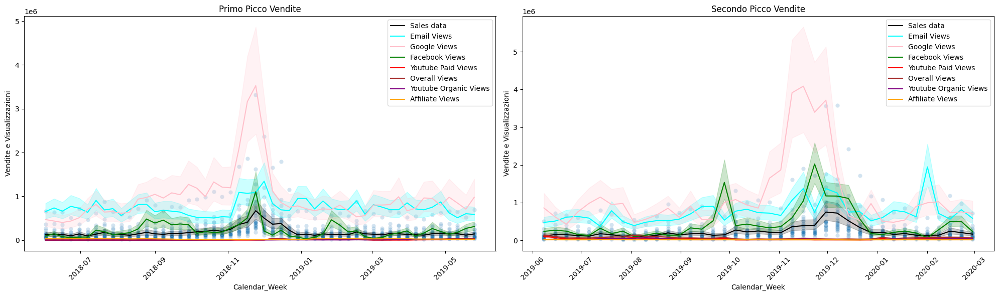

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

# Creazione della figura con 2 sottoplot
# 'figsize' definisce la dimensione della figura (larghezza, altezza)
fig, axes = plt.subplots(1, 2, figsize=(20, 6))

# Creazione dei sottoinsiemi dei dati
# Filtriamo il DataFrame per estrarre i dati del primo picco vendite
df_primo_picco_vendite = df.loc[(df['Calendar_Week'] > '2018-06-01') & (df['Calendar_Week'] < '2019-06-01')]
# Filtriamo il DataFrame per estrarre i dati del secondo picco vendite
df_secondo_picco_vendite = df.loc[(df['Calendar_Week'] > '2019-06-01') & (df['Calendar_Week'] < '2020-06-01')]

# Lista delle colonne da tracciare con i rispettivi colori e etichette
# Ogni tupla contiene il nome della colonna da tracciare, il colore della linea, e l'etichetta della legenda
plot_info = [
    ('Sales', 'black', 'Sales data'),
    ('Email_Impressions', 'cyan', 'Email Views'),
    ('Google_Impressions', 'pink', 'Google Views'),
    ('Facebook_Impressions', 'green', 'Facebook Views'),
    ('Paid_Views', 'red', 'Youtube Paid Views'),
    ('Overall_Views', 'brown', 'Overall Views'),
    ('Organic_Views', 'purple', 'Youtube Organic Views'),
    ('Affiliate_Impressions', 'orange', 'Affiliate Views')
]

# Grafico sul primo sottoplot
# Creiamo un grafico a dispersione per i dati delle vendite (Y) rispetto alla settimana (X)
sns.scatterplot(data=df_primo_picco_vendite, y='Sales', x='Calendar_Week', ax=axes[0], alpha=0.2)
# Aggiungiamo le linee per ogni variabile di interesse (Email Views, Google Views, etc.) usando un ciclo
for y_col, color, label in plot_info:
    sns.lineplot(data=df_primo_picco_vendite, x='Calendar_Week', y=y_col, ax=axes[0], color=color, label=label)

# Rotazione delle etichette sull'asse X (settimane) per migliorarne la leggibilità
axes[0].tick_params(axis='x', rotation=45)
# Titolo del primo sottoplot
axes[0].set_title('Primo Picco Vendite')
# Etichetta dell'asse Y
axes[0].set_ylabel('Vendite e Visualizzazioni')
# Aggiunta della legenda per identificare le linee tracciate
axes[0].legend()

# Grafico sul secondo sottoplot
# Creiamo un grafico a dispersione per i dati delle vendite (Y) rispetto alla settimana (X)
sns.scatterplot(data=df_secondo_picco_vendite, y='Sales', x='Calendar_Week', ax=axes[1], alpha=0.2)
# Aggiungiamo le linee per ogni variabile di interesse (Email Views, Google Views, etc.) usando un ciclo
for y_col, color, label in plot_info:
    sns.lineplot(data=df_secondo_picco_vendite, x='Calendar_Week', y=y_col, ax=axes[1], color=color, label=label)

# Rotazione delle etichette sull'asse X (settimane) per migliorarne la leggibilità
axes[1].tick_params(axis='x', rotation=45)
# Titolo del secondo sottoplot
axes[1].set_title('Secondo Picco Vendite')
# Etichetta dell'asse Y
axes[1].set_ylabel('Vendite e Visualizzazioni')
# Aggiunta della legenda per identificare le linee tracciate
axes[1].legend()

# Ottimizzazione del layout per evitare sovrapposizioni tra i grafici
plt.tight_layout()
# Visualizzazione del grafico
plt.show()


# Spiegazione grafico precedente:

## Come si presentano i due picchi principali con le varie visualizzazioni sovrapposte? Ci sono sostanziali differenza in termini di quantità? Quanto sono stabili col passare del tempo?

Il codice genera un grafico con due sottografici (subplots), ciascuno rappresentante un periodo distinto di vendite. La figura mostra l'andamento delle **vendite** e delle **visualizzazioni** (da diverse fonti, come Email, Google, Facebook, ecc.) durante due picchi di vendite, uno dal **2018 al 2019** e l'altro dal **2019 al 2020**.

1. **Primo sottografico** (a sinistra): mostra i dati delle vendite e delle visualizzazioni per il primo picco.
2. **Secondo sottografico** (a destra): rappresenta lo stesso tipo di dati per il secondo picco.

Ogni grafico include:
- Un grafico a dispersione (Scatterplot) e uno a linea (Lineplot) per visualizzare le vendite nel tempo (sull'asse delle Y) rispetto alle settimane (sull'asse delle X).
- Linee colorate che rappresentano altre variabili, come le visualizzazioni da Email, Google, Facebook, ecc.
- Le etichette delle settimane sono ruotate per migliorarne la leggibilità.

Infine, vengono aggiunti titoli, etichette e legende per facilitare l'interpretazione dei dati. Il layout della figura è ottimizzato per evitare sovrapposizioni tra i grafici.

### **Osservazioni**:
Come possiamo notare, nella sovrapposizione di dati spiccano le visualizzazioni provenienti da Google, Email e Facebook, non solo per i vari picchi raggiunti, ma anche per la loro costante mole lungo il passare dei mesi.


&nbsp;

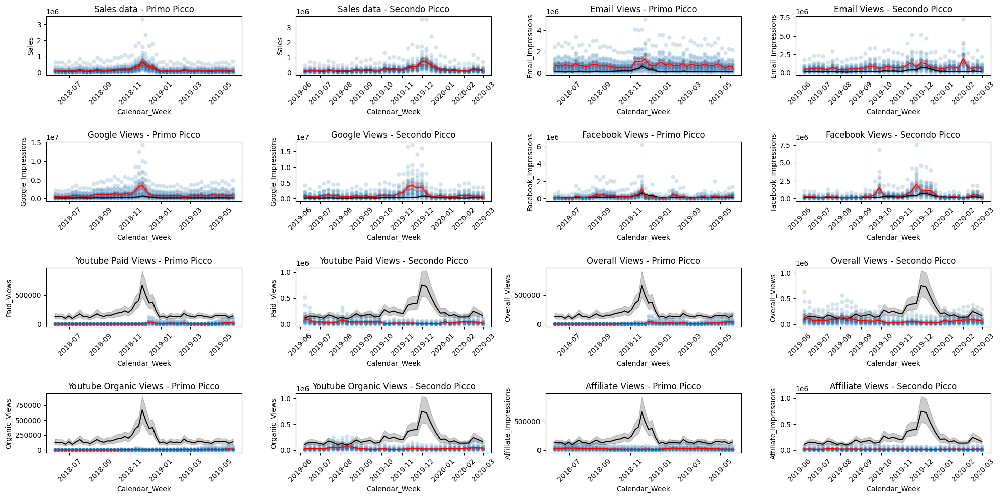

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Separazione dei sottoinsiemi dei dati
df_primo_picco_vendite = df.loc[(df['Calendar_Week'] > '2018-06-01') & (df['Calendar_Week'] < '2019-06-01')]
df_secondo_picco_vendite = df.loc[(df['Calendar_Week'] > '2019-06-01') & (df['Calendar_Week'] < '2020-06-01')]

# Lista delle colonne da tracciare con i rispettivi colori
plot_info = [
    ('Sales', 'red', 'Sales data'),
    ('Email_Impressions', 'red', 'Email Views'),
    ('Google_Impressions', 'red', 'Google Views'),
    ('Facebook_Impressions', 'red', 'Facebook Views'),
    ('Paid_Views', 'red', 'Youtube Paid Views'),
    ('Overall_Views', 'red', 'Overall Views'),
    ('Organic_Views', 'red', 'Youtube Organic Views'),
    ('Affiliate_Impressions', 'red', 'Affiliate Views')
]

# Creazione della griglia 4x4
fig, axes = plt.subplots(4, 4, figsize=(20, 10))

# Ciclo per assegnare ciascun elemento della lista plot_info a una coppia di grafici nella rispettiva riga
for idx, (y_col, color, title) in enumerate(plot_info):
    # Determinare la posizione sulla griglia 4x4
    row = idx // 2  # Calcola la riga
    col_left = idx * 2 % 4  # Colonna sinistra
    col_right = col_left + 1  # Colonna destra

    # Scatter e lineplot per il primo sottoinsieme di dati
    sns.scatterplot(
        data=df_primo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_left],
        alpha=0.2
    )
    sns.lineplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[row, col_left], color = 'black')
    sns.lineplot(
        data=df_primo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_left],
        color=color
    )
    axes[row, col_left].tick_params(axis='x', rotation=45)
    axes[row, col_left].set_title(f'{title} - Primo Picco')

    # Scatter e lineplot per il secondo sottoinsieme di dati
    sns.scatterplot(
        data=df_secondo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_right],
        alpha=0.2
    )
    sns.lineplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[row, col_right], color = 'black')
    sns.lineplot(
        data=df_secondo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_right],
        color=color
    )
    axes[row, col_right].tick_params(axis='x', rotation=45)
    axes[row, col_right].set_title(f'{title} - Secondo Picco')

# Ottimizzazione della visualizzazione
plt.tight_layout()
plt.show()


In [14]:
import pandas as pd
import plotly.express as px
from matplotlib import colors as mcolors

colonne = df.columns[2:9]  # Selezionare le colonne numeriche di interesse

# Creare una struttura con dati filtrati per le colonne numeriche
filtered_data = []

for week in df['Calendar_Week'].unique():
    weekly_df = df[df['Calendar_Week'] == week]
    
    for col in colonne:
        # Aggiungere i valori medi delle colonne
        filtered_data.append({
            "week": week,
            "column": col,
            "value": weekly_df[col].mean(),
        })

filtered_df = pd.DataFrame(filtered_data)

# Calcolare l'andamento settimanale delle vendite
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()

# Creare il grafico principale
fig = px.line(
    filtered_df,
    x="week",
    y="value",
    color="column",
)

# Aggiungere la linea delle vendite al grafico
fig.add_scatter(
    x=weekly_sales["Calendar_Week"],
    y=weekly_sales["Sales"],
    mode="lines+markers",
    name="Vendite",
    line=dict(color="black", dash="dash"),
    hoverinfo="x+y",
    marker=dict(size=6)
)

# Ridurre la luminosità dei marker delle colonne
for trace in fig.data:
    if trace.mode == "lines":
        darkened_marker_color = mcolors.to_rgba(trace.line.color, 0.6)  # Scurire il marker
        trace.update(marker=dict(size=6, color=darkened_marker_color))

# Aggiornare layout
fig.update_layout(
    title="Andamento delle Impressions e Vendite Settimanali",
    xaxis_title="Settimane del calendario",
    yaxis_title="Valori delle colonne filtrati",
)

fig.show()


il grafico sopèra mostra l'andamento complessivo delle vendite in proporzione alle impressions

Errore con la metrica 'Calendar_Week': Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`


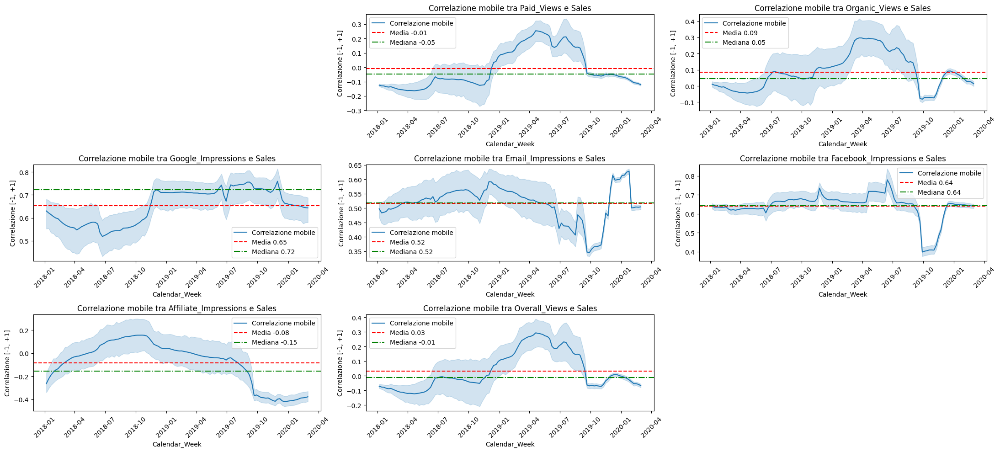

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica della griglia
fig, axes = plt.subplots(3, 3, figsize=(22, 10))  # Griglia 3x3 di grafici

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        try:
            # Calcolare la correlazione mobile con finestra di 30
            rolling_corr = df[colonne[idx]].rolling(window=90).corr(df['Sales'])#810

            # Calcolare statistiche mobili (media, mediana, massimo, minimo) su finestra rolling
            rolling_mean = rolling_corr.mean()
            rolling_median = rolling_corr.median()
            # rolling_max = rolling_corr.max()
            # rolling_min = rolling_corr.min()

            # Disegnare il grafico di correlazione mobile
            sns.lineplot(x=df['Calendar_Week'], y=rolling_corr, ax=axes[row, col], label='Correlazione mobile')

            # Disegnare le medie e statistiche con axhline
            axes[row, col].axhline(y=rolling_mean, color='red', linestyle='--', label=f'Media {rolling_mean:.2f}')
            axes[row, col].axhline(y=rolling_median, color='green', linestyle='-.', label=f'Mediana {rolling_median:.2f}')
            #axes[row, col].axhline(y=rolling_max, color='blue', linestyle=':', label=f'Massimo picco {rolling_max:.2f}')
            #axes[row, col].axhline(y=rolling_min, color='orange', linestyle=':', label=f'Minimo picco {rolling_min:.2f}')

            # p_x_max = df.loc[df[colonne[idx]].idxmax(), 'Calendar_Week']
            # p_x_min = df.loc[df[colonne[idx]].idxmin(), 'Calendar_Week']
                        # Aggiungere una axvline al massimo
            # axes[row, col].axvline(x=p_x_max, color='blue', linestyle=':', label=f'Picco max di {rolling_max:.1f} il {str(p_x_max)[:10]}')

            # # Aggiungere una axvline al minimo
            # axes[row, col].axvline(x=p_x_min, color='orange', linestyle=':', label=f'Picco min di {rolling_min:.1f} il {str(p_x_min)[:10]}')
            
            # Impostare il titolo e le etichette degli assi
            axes[row, col].set_title(f'Correlazione mobile tra {colonne[idx]} e Sales')
            axes[row, col].set_ylabel('Correlazione [-1, +1]')
            axes[row, col].tick_params(axis='x', rotation=45)

            # Impostare la legenda
            axes[row, col].legend(fontsize=10)

        except Exception as e:
            # Se c'è un errore nel calcolo o nella visualizzazione, stampare l'errore
            axes[row, col].axis('off')
            print(f"Errore con la metrica '{colonne[idx]}': {e}")

    else:
        # Se ci sono spazi vuoti nella griglia, nascondere l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


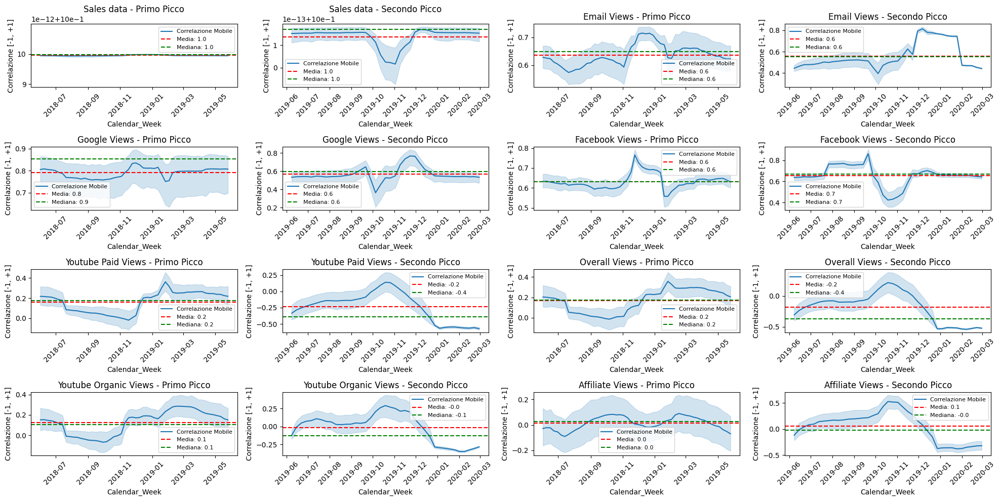

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Separazione dei sottoinsiemi dei dati
df_primo_picco_vendite = df.loc[(df['Calendar_Week'] > '2018-06-01') & (df['Calendar_Week'] < '2019-06-01')]
df_secondo_picco_vendite = df.loc[(df['Calendar_Week'] > '2019-06-01') & (df['Calendar_Week'] < '2020-06-01')]

# Lista delle metriche da tracciare con relativi titoli
plot_info = [
    ('Sales', 'red', 'Sales data'),
    ('Email_Impressions', 'red', 'Email Views'),
    ('Google_Impressions', 'red', 'Google Views'),
    ('Facebook_Impressions', 'red', 'Facebook Views'),
    ('Paid_Views', 'red', 'Youtube Paid Views'),
    ('Overall_Views', 'red', 'Overall Views'),
    ('Organic_Views', 'red', 'Youtube Organic Views'),
    ('Affiliate_Impressions', 'red', 'Affiliate Views')
]

# Creazione della griglia 4x4
fig, axes = plt.subplots(4, 4, figsize=(20, 10))

# Ciclo per calcolare e tracciare la correlazione mobile con finestra 10 per ciascun sottoinsieme
for idx, (y_col, color, title) in enumerate(plot_info):
    # Determinare la posizione sulla griglia 4x4
    row = idx // 2  # Calcola la riga
    col_left = idx * 2 % 4  # Colonna sinistra
    col_right = col_left + 1  # Colonna destra

    try:
        # Calcolare la correlazione mobile con finestra 10 e gestire NaN con fillna
        rolling_corr_primo = df_primo_picco_vendite[y_col].rolling(window=60).corr(df_primo_picco_vendite['Sales'])#.fillna(0)
        rolling_corr_secondo = df_secondo_picco_vendite[y_col].rolling(window=30).corr(df_secondo_picco_vendite['Sales'])#.fillna(0)

        # # Calcolo dei massimi e minimi per il primo picco
        # rolling_corr_primo_max = rolling_corr_primo.max()
        # rolling_corr_primo_min = rolling_corr_primo.min()

        # # Calcolo dei massimi e minimi per il secondo picco
        # rolling_corr_secondo_max = rolling_corr_secondo.max()
        # rolling_corr_secondo_min = rolling_corr_secondo.min()

        # # Calcoliamo i picchi con la loro corrispondenza in Calendar_Week
        # p1_x_max = df_primo_picco_vendite.loc[rolling_corr_primo.idxmax(), 'Calendar_Week']
        # p1_x_min = df_primo_picco_vendite.loc[rolling_corr_primo.idxmin(), 'Calendar_Week']

        # p2_x_max = df_secondo_picco_vendite.loc[rolling_corr_secondo.idxmax(), 'Calendar_Week']
        # p2_x_min = df_secondo_picco_vendite.loc[rolling_corr_secondo.idxmin(), 'Calendar_Week']

        # Tracciare la correlazione mobile per il primo picco
        sns.lineplot(
            x=df_primo_picco_vendite['Calendar_Week'],
            y=rolling_corr_primo,
            ax=axes[row, col_left],
            label='Correlazione Mobile'
        )
        axes[row, col_left].axhline(y=rolling_corr_primo.mean(), color='red', linestyle='--', label=f'Media: {rolling_corr_primo.mean():.1f}')
        axes[row, col_left].axhline(y=rolling_corr_primo.median(), color='green', linestyle='--', label=f'Mediana: {rolling_corr_primo.median():.1f}')
        axes[row, col_left].set_title(f'{title} - Primo Picco')
        # axes[row, col_left].axvline(x=p1_x_max, color='blue', linestyle=':', label=f'Picco max {rolling_corr_primo_max:.2f} il {str(p1_x_max)[:10]}')
        # axes[row, col_left].axvline(x=p1_x_min, color='orange', linestyle=':', label=f'Picco min {rolling_corr_primo_min:.2f} il {str(p1_x_min)[:10]}')
        axes[row, col_left].tick_params(axis='x', rotation=45)
        axes[row, col_left].set_ylabel('Correlazione [-1, +1]')
        axes[row, col_left].legend(fontsize=8)

        # Tracciare la correlazione mobile per il secondo picco
        sns.lineplot(
            x=df_secondo_picco_vendite['Calendar_Week'],
            y=rolling_corr_secondo,
            ax=axes[row, col_right],
            label='Correlazione Mobile'
        )
        axes[row, col_right].axhline(y=rolling_corr_secondo.mean(), color='red', linestyle='--', label=f'Media: {rolling_corr_secondo.mean():.1f}')
        axes[row, col_right].axhline(y=rolling_corr_secondo.median(), color='green', linestyle='--', label=f'Mediana: {rolling_corr_secondo.median():.1f}')
        axes[row, col_right].set_title(f'{title} - Secondo Picco')
        # axes[row, col_right].axvline(x=p2_x_max, color='blue', linestyle=':', label=f'Picco max {rolling_corr_secondo_max:.2f} il {str(p2_x_max)[:10]}')
        # axes[row, col_right].axvline(x=p2_x_min, color='orange', linestyle=':', label=f'Picco min {rolling_corr_secondo_min:.2f} il {str(p2_x_min)[:10]}')
        axes[row, col_right].tick_params(axis='x', rotation=45)
        axes[row, col_right].set_ylabel('Correlazione [-1, +1]')
        axes[row, col_right].legend(fontsize=8)

    except Exception as e:
        # Se c'è un errore nel calcolo o nella visualizzazione, disattivare l'asse
        axes[row, col_left].axis('off')
        axes[row, col_right].axis('off')
        print(f"Errore con la metrica '{y_col}': {e}")

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


In [26]:
df.columns[1:9]

Index(['Calendar_Week', 'Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'], dtype='object')

Errore con la metrica 'Calendar_Week': Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`


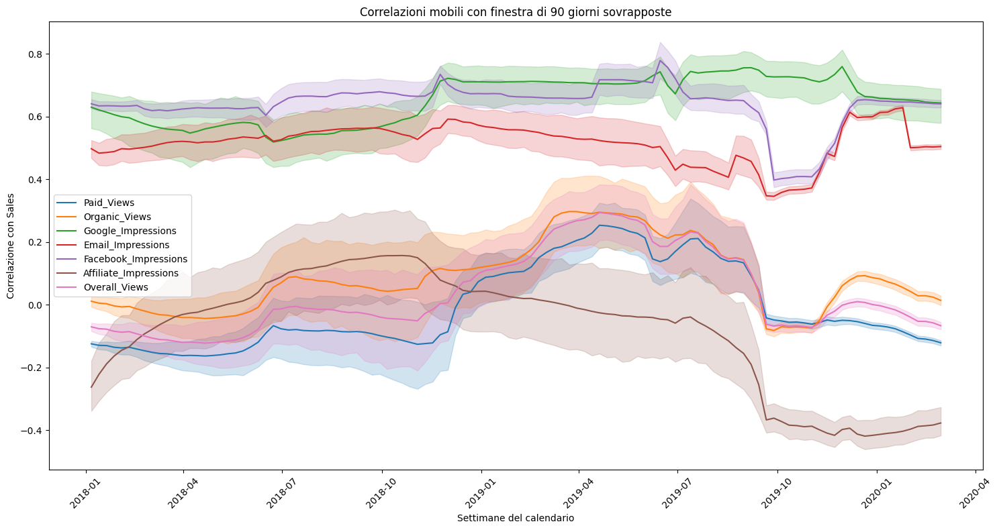

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione del grafico unico
plt.figure(figsize=(15, 8))

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Ciclo per disegnare ciascun lineplot in un unico grafico
for col in colonne:
    try:
        # Calcolare la correlazione mobile con finestra di 30
        rolling_corr = df[col].rolling(window=90).corr(df['Sales'])
        
        # Disegnare la correlazione mobile per ciascuna metrica
        sns.lineplot(x=df['Calendar_Week'], y=rolling_corr, label=col)
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Ottimizzare il grafico
plt.xlabel('Settimane del calendario')
plt.ylabel('Correlazione con Sales')
plt.title('Correlazioni mobili con finestra di 90 giorni sovrapposte')
plt.xticks(rotation=45)
plt.legend(fontsize=10)
plt.tight_layout()
plt.show()


Errore con la metrica 'Calendar_Week': Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`


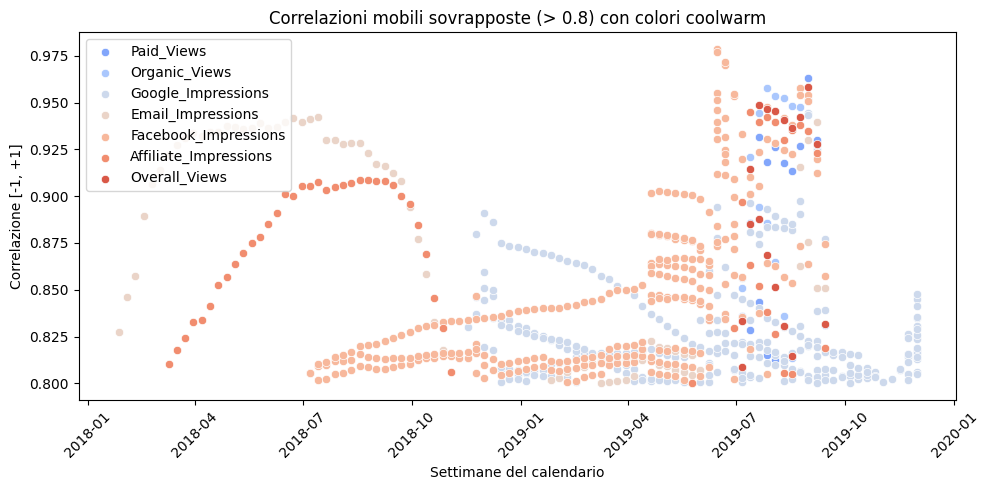

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica del grafico unico
fig, ax = plt.subplots(figsize=(10, 5))  # Un'unica finestra

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Creazione di una scala di colori con "coolwarm"
colors = sns.color_palette("coolwarm", len(colonne))

# Ciclo per sovrapporre ciascun grafico con la sua correlazione mobile
for idx, col in enumerate(colonne):
    try:
        # Calcolare la correlazione mobile con finestra di 30
        rolling_corr = df[col].rolling(window=90).corr(df['Sales'])
        
        # Applicare la maschera per considerare solo valori > 0.8
        mask = rolling_corr > 0.8
        
        # Disegnare il grafico sovrapposto solo con la porzione > 0.8
        sns.scatterplot(x=df['Calendar_Week'][mask], y=rolling_corr[mask], ax=ax, label=col, color=colors[idx])
    except Exception as e:
        # Stampare l'errore se qualcosa va storto
        print(f"Errore con la metrica '{col}': {e}")

# Impostazioni titoli e leggibilità
ax.set_title('Correlazioni mobili sovrapposte (> 0.8) con colori coolwarm')
ax.set_xlabel('Settimane del calendario')
ax.set_ylabel('Correlazione [-1, +1]')
ax.tick_params(axis='x', rotation=45)  # Rotazione degli assi x per miglior leggibilità

# Leggibilità migliorata con la leggenda
plt.legend(loc="upper left")
plt.tight_layout()
plt.show()


In [7]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Calcolo dinamico delle correlazioni mobili
rolling_data = []

window_size = 90  # Impostiamo la finestra mobile dinamica (puoi cambiarla facilmente)

for col in colonne:
    try:
        # Calcolare la correlazione mobile su finestra di window_size
        rolling_corr = df['Sales'].rolling(window=window_size).corr(df[col])

        # Evitare calcoli con NaN derivanti dalla finestra mobile e mascherare solo i valori > 0.8
        corr = 0.65
        mask = (rolling_corr > corr) #& (~rolling_corr.isna())

        # Estratto solo dove la finestra è pienamente calcolata
        valid_indices = rolling_corr.index[mask]

        # Correlazioni valide e settimane corrispondenti
        valid_corr = rolling_corr.loc[valid_indices]
        valid_weeks = df.loc[valid_indices, 'Calendar_Week']

        # Solo se esistono valori validi
        if not valid_corr.empty:
            rolling_data.append({
                "column": col,
                "week": valid_weeks,
                "rolling_corr": valid_corr
            })
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Creare un DataFrame per visualizzare i risultati con Plotly
filtered_df = pd.DataFrame({
    "week": [],
    "rolling_corr": [],
    "column": []
})

# Combina correttamente ogni serie dei dati calcolati
for data in rolling_data:
    temp_df = pd.DataFrame({
        "week": data["week"],
        "rolling_corr": data["rolling_corr"],
        "column": [data["column"]] * len(data["rolling_corr"])
    })
    filtered_df = pd.concat([filtered_df, temp_df], ignore_index=True)

# Calcolare l'andamento settimanale delle vendite medie
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()
weekly_sales.rename(columns={"Sales": "weekly_mean_sales"}, inplace=True)

# Creazione del grafico combinato
fig = go.Figure()

# Scatter plot per le correlazioni mobili
for col in filtered_df['column'].unique():
    col_df = filtered_df[filtered_df['column'] == col]
    fig.add_trace(go.Scatter(
        x=col_df['week'],
        y=col_df['rolling_corr'],
        mode='markers',
        name=col
    ))

# Linea delle vendite settimanali su scala separata con colore nero
fig.add_trace(go.Scatter(
    x=weekly_sales["Calendar_Week"],
    y=weekly_sales["weekly_mean_sales"],
    mode='lines+markers',
    name="Vendite settimanali",
    yaxis="y2",
    line=dict(color="grey")  # Impostato il colore a nero
))

# Aggiornamento layout con una seconda scala Y
fig.update_layout(
    title=f"Correlazioni mobili > {corr} con finestra mobile di {window_size} giorni e vendite settimanali",
    xaxis_title="Settimane del calendario",
    yaxis=dict(
        title="Correlazione con Sales",
        side="left"
    ),
    yaxis2=dict(
        title="Vendite settimanali",
        overlaying="y",
        side="right"
    ),
    showlegend=True
)

# Mostrare il grafico
fig.show()


Errore con la metrica 'Calendar_Week': cannot perform __rmul__ with this index type: DatetimeArray


In [9]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Calcolo dinamico delle correlazioni mobili
rolling_data = []
window_size = 90  # Impostiamo la finestra mobile dinamica
corr_threshold = 0.65  # Impostazione della soglia minima di correlazione

for col in colonne:
    try:
        # Calcolare la correlazione mobile su finestra di window_size
        rolling_corr = df['Sales'].rolling(window=window_size).corr(df[col])

        # Mascherare solo i valori di correlazione > corr_threshold
        mask = rolling_corr > corr_threshold
        valid_corr = rolling_corr[mask]
        valid_weeks = df.loc[mask, 'Calendar_Week']

        # Calcolare correlazioni settimanali
        if not valid_corr.empty:
            rolling_data.append({
                "column": col,
                "week": valid_weeks,
                "rolling_corr": valid_corr
            })
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Creare un DataFrame per visualizzare i risultati con Plotly
filtered_df = pd.DataFrame({
    "week": [],
    "rolling_corr": [],
    "column": []
})

for data in rolling_data:
    temp_df = pd.DataFrame({
        "week": data["week"],
        "rolling_corr": data["rolling_corr"],
        "column": [data["column"]] * len(data["rolling_corr"])
    })
    filtered_df = pd.concat([filtered_df, temp_df], ignore_index=True)

# Calcolo del conteggio settimanale di ciascuna metrica distinta
weekly_count_corr = filtered_df.groupby(['week', 'column']).size().reset_index(name="count_corr")

# Calcolare l'andamento settimanale delle vendite medie
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()
weekly_sales.rename(columns={"Sales": "weekly_mean_sales", "Calendar_Week": "week"}, inplace=True)

# Creazione grafico con Plotly
fig = go.Figure()

# Grafici a barre settimanali distinti per ciascun impression/colonna con dettagli nel tooltip
for col in weekly_count_corr['column'].unique():
    col_df = weekly_count_corr[weekly_count_corr['column'] == col]
    
    # Aggiunta delle informazioni al tooltip con dettagli
    fig.add_trace(go.Bar(
        x=col_df['week'],
        y=col_df['count_corr'],
        name=col,
        marker=dict(opacity=0.7),
        text=[
            f"Impression: {col}<br>"
            f"Settimana: {week.strftime('%Y-%U')}<br>"
            f"Conteggio correlazioni: {count}"
            for week, count in zip(col_df['week'], col_df['count_corr'])
        ],
        textposition='auto',
        hoverinfo="text"
    ))

# Sovrapposizione delle vendite settimanali con scala separata
fig.add_trace(go.Scatter(
    x=weekly_sales["week"],
    y=weekly_sales["weekly_mean_sales"],
    mode='lines+markers',
    name="Vendite settimanali",
    line=dict(color="black", width=2),
    yaxis="y2"
))

# Aggiornamento layout con due scale Y
fig.update_layout(
    title=f"Conteggio delle correlazioni > di {corr_threshold} settimanali per ciascun impressions con finestra mobile di {window_size} giorni e con vendite settimanali sovrapposte",
    xaxis_title="Settimane del calendario",
    yaxis=dict(
        title=f"Conteggio delle correlazioni superiori a {corr_threshold}"
    ),
    yaxis2=dict(
        title="Vendite settimanali",
        overlaying="y",
        side="right"
    ),
    barmode="group",
    showlegend=True
)

# Mostrare il grafico
fig.show()


Errore con la metrica 'Calendar_Week': cannot perform __rmul__ with this index type: DatetimeArray


In [10]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Calcolo dinamico delle correlazioni mobili
rolling_data = []
window_size = 90  # Impostiamo la finestra mobile dinamica
corr_threshold = 0.65  # Impostazione della soglia minima di correlazione

for col in colonne:
    try:
        # Calcolare la correlazione mobile su finestra di window_size
        rolling_corr = df['Sales'].rolling(window=window_size).corr(df[col])

        # Mascherare solo i valori di correlazione > corr_threshold
        mask = rolling_corr > corr_threshold
        valid_corr = rolling_corr[mask]
        valid_weeks = df.loc[mask, 'Calendar_Week']

        # Convertire la settimana in una scala mensile per aggregare
        valid_months = valid_weeks.dt.to_period('M').dt.to_timestamp()

        if not valid_corr.empty:
            rolling_data.append({
                "column": col,
                "month": valid_months,
                "rolling_corr": valid_corr
            })
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Creare un DataFrame per visualizzare i risultati con Plotly
filtered_df = pd.DataFrame({
    "month": [],
    "rolling_corr": [],
    "column": []
})

for data in rolling_data:
    temp_df = pd.DataFrame({
        "month": data["month"],
        "rolling_corr": data["rolling_corr"],
        "column": [data["column"]] * len(data["rolling_corr"])
    })
    filtered_df = pd.concat([filtered_df, temp_df], ignore_index=True)

# Calcolo del conteggio mensile di ciascuna metrica distinta
monthly_count_corr = filtered_df.groupby(['month', 'column']).size().reset_index(name="count_corr")

# Calcolare l'andamento settimanale delle vendite medie
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()
weekly_sales.rename(columns={"Sales": "weekly_mean_sales", "Calendar_Week": "week"}, inplace=True)

# Creazione grafico con Plotly
fig = go.Figure()

# Grafici a barre mensili distinti per ciascun impression/colonna
for col in monthly_count_corr['column'].unique():
    col_df = monthly_count_corr[monthly_count_corr['column'] == col]
    
    # Aggiunta delle informazioni al tooltip
    fig.add_trace(go.Bar(
        x=col_df['month'],
        y=col_df['count_corr'],
        name=col,
        marker=dict(opacity=0.7),
        text=[f"Impression: {col}<br>Mese: {month}<br>Conteggio correlazioni: {count}" 
              for month, count in zip(col_df['month'], col_df['count_corr'])],
        hoverinfo="text"
    ))

# Sovrapposizione delle vendite settimanali con scala separata
fig.add_trace(go.Scatter(
    x=weekly_sales["week"],
    y=weekly_sales["weekly_mean_sales"],
    mode='lines+markers',
    name="Vendite settimanali",
    line=dict(color="black", width=2),
    yaxis="y2"
))

# Aggiornamento layout con due scale Y
fig.update_layout(
    title=f"Conteggio delle correlazioni > di {corr_threshold} mensili per ciascun impressions con finestra mobile di {window_size} giorni e con vendite settimanali sovrapposte",
    xaxis_title="Mesi",
    yaxis=dict(
        title=f"Conteggio delle correlazioni superiori a {corr_threshold}"
    ),
    yaxis2=dict(
        title="Vendite settimanali",
        overlaying="y",
        side="right"
    ),
    barmode="group",
    showlegend=True
)

# Mostrare 


Errore con la metrica 'Calendar_Week': cannot perform __rmul__ with this index type: DatetimeArray


# Analisi grafici basati sul tempo
Come si può notare dai grafici, prendendo come riferimento l'ultimo in basso a destra, ovvero quello che mostra le vendite di settimana in settimana


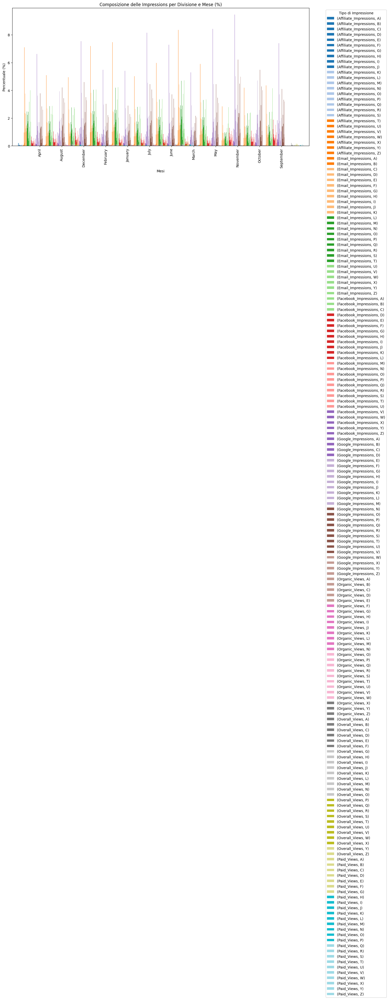

In [41]:
import matplotlib.pyplot as plt

# Creiamo una tabella pivot per ottenere la somma delle impressions per ogni mese e divisione
pivot_impressions = df.pivot_table(values=['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 
                                          'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'], 
                                   index='Month', columns='Division', aggfunc='sum')

# Calcoliamo la percentuale di ciascun tipo di impressione rispetto al totale delle impressioni per ogni mese e divisione
pivot_impressions_percent = pivot_impressions.div(pivot_impressions.sum(axis=1), axis=0) * 100

# Creiamo il grafico a barre impilate
fig, ax = plt.subplots(figsize=(15, 7))

# Grafico delle percentuali di impressions per divisione e mese
pivot_impressions_percent.plot(kind='bar', stacked=False, ax=ax, colormap='tab20', width=2)

# Migliorare la leggibilità
ax.set_title('Composizione delle Impressions per Divisione e Mese (%)')
ax.set_ylabel('Percentuale (%)')
ax.set_xlabel('Mesi')

# Aggiungere la legenda
ax.legend(title='Tipo di Impressione', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ottimizzare lo spazio tra gli elementi
plt.tight_layout()

# Mostrare il grafico
plt.show()


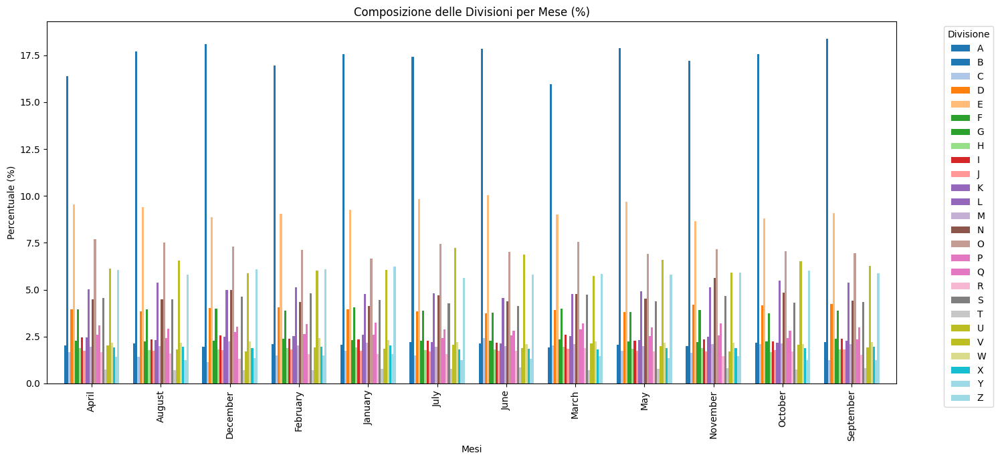

In [26]:
import matplotlib.pyplot as plt

# Creiamo una tabella pivot per ottenere la somma delle vendite per ogni mese e divisione
pivot_sales = df.pivot_table(values='Sales', index='Month', columns='Division', aggfunc='sum')

# Calcoliamo la percentuale di ciascuna divisione rispetto al totale delle vendite per ogni mese
pivot_sales_percent = pivot_sales.div(pivot_sales.sum(axis=1), axis=0) * 100

# Creiamo il grafico a barre
fig, ax = plt.subplots(figsize=(15, 7))

# Grafico delle percentuali di divisione per mese
pivot_sales_percent.plot(kind='bar', stacked=False, ax=ax, colormap='tab20', width=0.8)

# Migliorare la leggibilità
ax.set_title('Composizione delle Divisioni per Mese (%)')
ax.set_ylabel('Percentuale (%)')
ax.set_xlabel('Mesi')

# Aggiungere la legenda
ax.legend(title='Divisione', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ottimizzare lo spazio tra gli elementi
plt.tight_layout()

# Mostrare il grafico
plt.show()


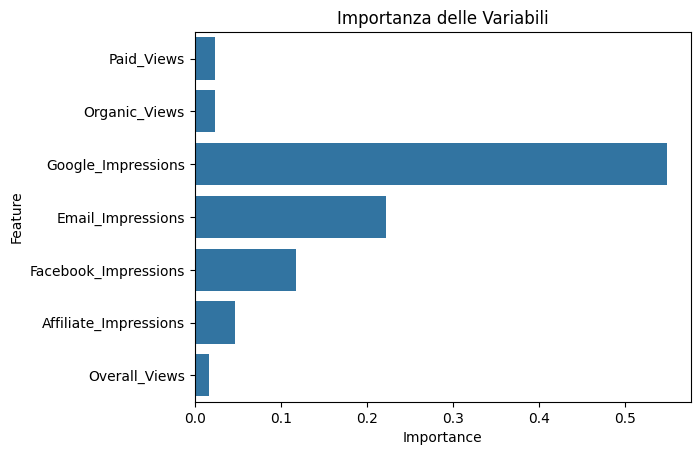

In [8]:
from sklearn.ensemble import RandomForestRegressor
#'Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'
X = df[df.columns[2:9]].dropna()
y = df['Sales'].dropna()

model = RandomForestRegressor()
model.fit(X, y)

feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': model.feature_importances_})
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Importanza delle Variabili')
plt.show()


In [71]:
from ydata_profiling import ProfileReport

# Crea il report con YData Profiling
profile = ProfileReport(df, title="Profilo dei Dati", explorative=True)
profile.to_notebook_iframe()

# Salva il report come HTML
#profile.to_file("ydata_profiling_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]